## Pre-requisites

In [1]:
!pip install smogn

import pandas as pd
import numpy as np
import nltk
import contractions
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tag import pos_tag
import string
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import torch.nn as nn
from transformers import BertModel
import torch
from transformers import BertTokenizer
import torch.nn.functional as F
from tqdm import tqdm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
import xgboost
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import math
import smogn
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import StratifiedKFold

%matplotlib inline

## Load Dataset

In [2]:
youtube_data = pd.read_csv('youtube_dislike_dataset_full_comments.csv')

In [3]:
youtube_data.drop(labels=['Unnamed: 0', 'video_id.1'], axis=1, inplace=True)
youtube_data

,video_id,title,channel_id,channel_title,published_at,view_count,likes,dislikes,comment_count,tags,...,comment_11,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20
0,--0bCF-iK2E,Jadon Sancho Magical Skills & Goals,UC6UL29enLNe4mqwTfAyeNuw,Bundesliga,2021-07-01 10:00:00,1048888,19515,226,1319,football soccer ftbol alemn Bundesliga season ...,...,The amount of opportunities he creates is ridi...,He was beast at dortmund hope in United he wil...,This was a nice tribute by the Bundesliga to S...,I'm dying for him to rediscover this form for ...,here after his first Man United goal. What a p...,Thank you for your service to Dortmund Jaden S...,He is forever a joy to watch. I wish you all t...,Saw him play for England the other day for fir...,"His arrival excites me, fans of Borussia Dortm...",Shockingly calm and collective in the box\nFan...
1,--14w5SOEUs,Migos - Avalanche (Official Video),UCGIelM2Dj3zza3xyV3pL3WQ,MigosVEVO,2021-06-10 16:00:00,15352638,359277,7479,18729,Migos Avalanche Quality Control Music/Motown R...,...,"20,30 and 40 years from now, this gonna be one...",Words can't describe how tragic his death is o...,"I'm 43 years old, and I've enjoyed the evoluti...",The way Migos flow on this track is just incre...,All 3 Changed the Game of Rap \nThere Will nev...,"Migos was so fresh, so fly. Undoubtedly, one ...","Out of Migos entire catalog, this is sincerely...","I have heard several Migos songs, I LISTENED t...",This is exactly why Migos need to be appreciat...,Wow!!! This is hip hop. I am from the East Coa...
2,--40TEbZ9Is,Supporting Actress in a Comedy: 73rd Emmys,UClBKH8yZRcM4AsRjDVEdjMg,Television Academy,2021-09-20 01:03:32,925281,11212,401,831,,...,"For those who may not know, Hannah Waddinghamâ...","For years she was theatres best kept secret, n...",The chemistry they have on and off screen make...,"Her blonde hair, hair do, skin tone, toned arm...",You can tell how grateful she is and how happy...,I feel like she really didnâ€™t expect this an...,Her acceptance speech is what put me over the ...,This is the kind of speech we love. genuine fu...,Best speech of the night! Hannah seems like su...,I nearly cried when I saw Jason's face. so muc...
3,--4tfbSyYDE,JO1'YOUNG (JO1 ver.)' PERFORMANCE VIDEO,UCsmXiDP8S40uBeJYxvyulmA,JO1,2021-03-03 10:00:17,2641597,39131,441,3745,PRODUCE101JAPAN JO1 TheSTAR STA...,...,ç§ã¯ãƒ‡ãƒ“ãƒ¥ãƒ¼ã—ã¦ã‹ã‚‰JO1ã‚’çŸ¥ã£ãŸã...,ãƒ¡ãƒ³ãƒãƒ¼ãŒè‚©ã®åŠ›ã‚’æŠœã„ã¦éŽåŽ»æ›²ã...,ã»ã‚“ã¨ã«ã€ã€ã€è“®ãã‚“ã€ã€\nã©ã“ã...,çš†ã•ã‚“ã®ã‚³ãƒ¡ãƒ³ãƒˆèª­ã‚“ã§ã¾ãŸæ¶™ãŒå...,ã‚„ã£ã±Youngã£ã¦ç¥žæ›²ã ã€ã€ã€ã€‚,YOUNGã®è“®ãã‚“ã‚‚ã‚‚ã®ã™ã”ãè‰¯ãã¦å®...,ãªã‚“ã§æœ¨å…¨æ­Œã†æ™‚ãƒãƒ¼ã‚«ãƒ¼ãƒ•ã‚§ã‚¤ã...,è“®ãã‚“ã€1O1ã®ã¨ãyoungè¸Šã£ã¦ãŸã®ã‚...,I never worry about life lifeã®ã¨ã“ã‚ã®è“...,ãƒ•ã‚¡ã‚¤ãƒŠãƒ«ã®2æ›²ã‚’ã“ã®åˆ¶æœã§ãƒ‘ãƒ•...
4,--DKkzWVh-E,Why Retaining Walls Collapse,UCMOqf8ab-42UUQIdVoKwjlQ,Practical Engineering,2021-12-07 13:00:00,715724,32887,367,1067,retaining wall New Jersey highway Direct Conne...,...,The soil-shear failure mode is really impressi...,Thanks to videos like these I massively overde...,I only ever did the calculations for one retai...,"Years ago as a baby apprentice electrician, I ...",I was on my HOA board for two (terrible) years...,You're single-handedly saving my interest in m...,I live right near the NJ project. It was wild ...,Super fascinating Grady! I'm wondering if you ...,"As a new geologist at a geotech firm, Iâ€™m le...","I also learned that in Japan, retaining walls ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33113,zzEblS1lEvU,Highlights: Leeds United 1-0 Burnley | Bamford...,UCyQcJHDN4uYfPa1DHzKVSnw,Leeds United Official,2020-12-27 22:00:19,182440,2681,73,217,Leeds United LUFC LUTV marcelo bielsa highlights,...,I never expected COD to be able to do somethin...,To all those saying how activision had to bend...,The First S

In [4]:
youtube_data.describe()

,view_count,likes,dislikes,comment_count
count,3.311800e+04,3.311800e+04,3.311800e+04,3.311800e+04
mean,5.756464e+06,1.695509e+05,5.053057e+03,1.028858e+04
std,2.318909e+07,5.493942e+05,3.091314e+04,1.240672e+05
min,2.036800e+04,2.200000e+01,3.000000e+00,1.000000e+00
25%,5.175170e+05,1.349025e+04,2.850000e+02,9.250000e+02
50%,1.329945e+06,4.325000e+04,8.040000e+02,2.375000e+03
75%,3.706302e+06,1.326208e+05,2.489000e+03,6.273750e+03
max,1.322797e+09,3.183768e+07,2.397733e+06,1.607103e+07


## Data Cleaning

### Check for nulls

In [5]:
youtube_data.isna().sum()

video_id         0
title            0
channel_id       0
channel_title    0
published_at     0
view_count       0
likes            0
dislikes         0
comment_count    0
tags             0
description      0
comments         0
comment_1        0
comment_2        0
comment_3        0
comment_4        0
comment_5        0
comment_6        0
comment_7        0
comment_8        0
comment_9        0
comment_10       0
comment_11       0
comment_12       0
comment_13       0
comment_14       0
comment_15       0
comment_16       0
comment_17       0
comment_18       0
comment_19       0
comment_20       0
dtype: int64

In [6]:
youtube_data.dropna(axis=0, inplace=True)

### Merge comments

In [7]:
def is_ascii(s):
    try:
        s.encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        return False
    else:
        return True


In [8]:
merged_columns = list()
cols = list(range(1, 21))
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for i in cols:
        comment += ' ' + data[f'comment_{i}']
    for c in comment:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)

In [9]:
youtube_data['merged_comments'] = merged_columns
youtube_data

,video_id,title,channel_id,channel_title,published_at,view_count,likes,dislikes,comment_count,tags,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,merged_comments
0,--0bCF-iK2E,Jadon Sancho Magical Skills & Goals,UC6UL29enLNe4mqwTfAyeNuw,Bundesliga,2021-07-01 10:00:00,1048888,19515,226,1319,football soccer ftbol alemn Bundesliga season ...,...,He was beast at dortmund hope in United he wil...,This was a nice tribute by the Bundesliga to S...,I'm dying for him to rediscover this form for ...,here after his first Man United goal. What a p...,Thank you for your service to Dortmund Jaden S...,He is forever a joy to watch. I wish you all t...,Saw him play for England the other day for fir...,"His arrival excites me, fans of Borussia Dortm...",Shockingly calm and collective in the box\nFan...,wish him well in manchester united Respect to...
1,--14w5SOEUs,Migos - Avalanche (Official Video),UCGIelM2Dj3zza3xyV3pL3WQ,MigosVEVO,2021-06-10 16:00:00,15352638,359277,7479,18729,Migos Avalanche Quality Control Music/Motown R...,...,Words can't describe how tragic his death is o...,"I'm 43 years old, and I've enjoyed the evoluti...",The way Migos flow on this track is just incre...,All 3 Changed the Game of Rap \nThere Will nev...,"Migos was so fresh, so fly. Undoubtedly, one ...","Out of Migos entire catalog, this is sincerely...","I have heard several Migos songs, I LISTENED t...",This is exactly why Migos need to be appreciat...,Wow!!! This is hip hop. I am from the East Coa...,RIP Takeoff. The world is gonna miss you and ...
2,--40TEbZ9Is,Supporting Actress in a Comedy: 73rd Emmys,UClBKH8yZRcM4AsRjDVEdjMg,Television Academy,2021-09-20 01:03:32,925281,11212,401,831,,...,"For years she was theatres best kept secret, n...",The chemistry they have on and off screen make...,"Her blonde hair, hair do, skin tone, toned arm...",You can tell how grateful she is and how happy...,I feel like she really didnâ€™t expect this an...,Her acceptance speech is what put me over the ...,This is the kind of speech we love. genuine fu...,Best speech of the night! Hannah seems like su...,I nearly cried when I saw Jason's face. so muc...,"I get that she isn't a nobody, but to see som..."
3,--4tfbSyYDE,JO1'YOUNG (JO1 ver.)' PERFORMANCE VIDEO,UCsmXiDP8S40uBeJYxvyulmA,JO1,2021-03-03 10:00:17,2641597,39131,441,3745,PRODUCE101JAPAN JO1 TheSTAR STA...,...,ãƒ¡ãƒ³ãƒãƒ¼ãŒè‚©ã®åŠ›ã‚’æŠœã„ã¦éŽåŽ»æ›²ã...,ã»ã‚“ã¨ã«ã€ã€ã€è“®ãã‚“ã€ã€\nã©ã“ã...,çš†ã•ã‚“ã®ã‚³ãƒ¡ãƒ³ãƒˆèª­ã‚“ã§ã¾ãŸæ¶™ãŒå...,ã‚„ã£ã±Youngã£ã¦ç¥žæ›²ã ã€ã€ã€ã€‚,YOUNGã®è“®ãã‚“ã‚‚ã‚‚ã®ã™ã”ãè‰¯ãã¦å®...,ãªã‚“ã§æœ¨å…¨æ­Œã†æ™‚ãƒãƒ¼ã‚«ãƒ¼ãƒ•ã‚§ã‚¤ã...,è“®ãã‚“ã€1O1ã®ã¨ãyoungè¸Šã£ã¦ãŸã®ã‚...,I never worry about life lifeã®ã¨ã“ã‚ã®è“...,ãƒ•ã‚¡ã‚¤ãƒŠãƒ«ã®2æ›²ã‚’ã“ã®åˆ¶æœã§ãƒ‘ãƒ•...,JAM 1JAMJO1 CB\n\nJO11\nJO1\nJAM\n\nJO1\nJO1 ...
4,--DKkzWVh-E,Why Retaining Walls Collapse,UCMOqf8ab-42UUQIdVoKwjlQ,Practical Engineering,2021-12-07 13:00:00,715724,32887,367,1067,retaining wall New Jersey highway Direct Conne...,...,Thanks to videos like these I massively overde...,I only ever did the calculations for one retai...,"Years ago as a baby apprentice electrician, I ...",I was on my HOA board for two (terrible) years...,You're single-handedly saving my interest in m...,I live right near the NJ project. It was wild ...,Super fascinating Grady! I'm wondering if you ...,"As a new geologist at a geotech firm, Iâ€™m le...","I also learned that in Japan, retaining walls ...",Keep up with all my projects here: https://p...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33113,zzEblS1lEvU,Highlights: Leeds United 1-0 Burnley | Bamford...,UCyQcJHDN4uYfPa1DHzKVSnw,Leeds United Official,2020-12-27 22:00:19,182440,2681,73,217,Leeds United LUFC LUTV marcelo bielsa highlights,...,To all those saying how activision had to bend...,The First Stage : Demoralization_x000D_\nThe S...,"FINALLY, Yuri

### Rearrange columns and drop unnecessary columns

In [10]:
youtube_data.drop(labels=['title', 'channel_id', 'channel_title', 'published_at', 'tags', 'description', 'comments'], inplace=True, axis=1)

In [11]:
# youtube_data = youtube_data[['video_id', 'view_count', 'likes', 'comment_count',
#        'merged_comments', 'dislikes']]

In [12]:
youtube_data

,video_id,view_count,likes,dislikes,comment_count,comment_1,comment_2,comment_3,comment_4,comment_5,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,merged_comments
0,--0bCF-iK2E,1048888,19515,226,1319,wish him well in manchester united,"Respect to Dortmund fans,must be sad losing him.",It's so heartbreaking look at Sancho playing f...,One of the most talented players Bundesliga ha...,"A real talent, hope he doesn't turn into anoth...",...,He was beast at dortmund hope in United he wil...,This was a nice tribute by the Bundesliga to S...,I'm dying for him to rediscover this form for ...,here after his first Man United goal. What a p...,Thank you for your service to Dortmund Jaden S...,He is forever a joy to watch. I wish you all t...,Saw him play for England the other day for fir...,"His arrival excites me, fans of Borussia Dortm...",Shockingly calm and collective in the box\nFan...,wish him well in manchester united Respect to...
1,--14w5SOEUs,15352638,359277,7479,18729,RIP Takeoff. The world is gonna miss you and y...,Itâ€™s been about 48 hrs since Takeoffâ€™s pas...,The amount of swag these 3 possess is unmatche...,RIP Takeoff ðŸ™ðŸ¾ðŸ™ðŸ¾ You will be misse...,I donâ€™t think this generation knows how powe...,...,Words can't describe how tragic his death is o...,"I'm 43 years old, and I've enjoyed the evoluti...",The way Migos flow on this track is just incre...,All 3 Changed the Game of Rap \nThere Will nev...,"Migos was so fresh, so fly. Undoubtedly, one ...","Out of Migos entire catalog, this is sincerely...","I have heard several Migos songs, I LISTENED t...",This is exactly why Migos need to be appreciat...,Wow!!! This is hip hop. I am from the East Coa...,RIP Takeoff. The world is gonna miss you and ...
2,--40TEbZ9Is,925281,11212,401,831,"I get that she isn't a nobody, but to see some...",You can tell Juno is not even that upset that ...,"â€œThereâ€™s no Rebecca without Keeleyâ€ god,...",Hannah looking straight into Jason's eyes sayi...,That was the shortest episode of Ted Lasso I h...,...,"For years she was theatres best kept secret, n...",The chemistry they have on and off screen make...,"Her blonde hair, hair do, skin tone, toned arm...",You can tell how grateful she is and how happy...,I feel like she really didnâ€™t expect this an...,Her acceptance speech is what put me over the ...,This is the kind of speech we love. genuine fu...,Best speech of the night! Hannah seems like su...,I nearly cried when I saw Jason's face. so muc...,"I get that she isn't a nobody, but to see som..."
3,--4tfbSyYDE,2641597,39131,441,3745,ï¼‘ï¼—ã®ç”·ã§ã™ãŒã€JAMã«ãªã£ã¦ã„ã„ã...,ã“ã®1å¹´é–“ã€æ—¥æœ¬ã®éŸ³æ¥½ç•ªçµ„ã«å‡ºã‚‰...,ã“ã®åˆ¶æœå§¿ã‚’è¦‹ã‚‹ã¨ã€ç¥¥ç”ŸãŒCâ†’Bã...,ã‚¸ãƒ£ãƒ‹ãƒ¼ã‚ºã®ã‚ˆã†ãªçˆ½ã‚„ã‹ã•ã‚‚ã‚ã...,JO1ã®çœŸæ‘¯ã•ã‚’ç§ã¯ä¿¡ã˜ã¦æ„›ã—ã¦ã„ã...,...,ãƒ¡ãƒ³ãƒãƒ¼ãŒè‚©ã®åŠ›ã‚’æŠœã„ã¦éŽåŽ»æ›²ã...,ã»ã‚“ã¨ã«ã€ã€ã€è“®ãã‚“ã€ã€\nã©ã“ã...,çš†ã•ã‚“ã®ã‚³ãƒ¡ãƒ³ãƒˆèª­ã‚“ã§ã¾ãŸæ¶™ãŒå...,ã‚„ã£ã±Youngã£ã¦ç¥žæ›²ã ã€ã€ã€ã€‚,YOUNGã®è“®ãã‚“ã‚‚ã‚‚ã®ã™ã”ãè‰¯ãã¦å®...,ãªã‚“ã§æœ¨å…¨æ­Œã†æ™‚ãƒãƒ¼ã‚«ãƒ¼ãƒ•ã‚§ã‚¤ã...,è“®ãã‚“ã€1O1ã®ã¨ãyoungè¸Šã£ã¦ãŸã®ã‚...,I never worry about life lifeã®ã¨ã“ã‚ã®è“...,ãƒ•ã‚¡ã‚¤ãƒŠãƒ«ã®2æ›²ã‚’ã“ã®åˆ¶æœã§ãƒ‘ãƒ•...,JAM 1JAMJO1 CB\n\nJO11\nJO1\nJAM\n\nJO1\nJO1 ...
4,--DKkzWVh-E,715724,32887,367,1067,ðŸš§ Keep up with all my projects here: https:...,Your mechanically stabilized earth video inspi...,I recently helped a friend renovate her mother...,I've worked in construction litigation (lawyer...,I built a big deck on my house some years ago ...,...,Thanks to videos like these I massively overde...,I only ever did the calculations for one retai...,"Years ago as a baby apprentice electrician, I ...",I was on my HOA board for two (terrible) years...,You're single-handedly saving my interest in m...,I live right near the NJ project. It was wild ...,Super fascinating Grady! I'm

### To lower case

In [13]:
youtube_data['merged_comments'] = youtube_data['merged_comments'].str.lower()

### Remove HTML and URLs from comments

In [14]:
youtube_data['merged_comments'] = youtube_data['merged_comments']\
    .replace('http\S+', ' ', regex=True)\
    .replace('www\S+', ' ', regex=True)\
    .replace('<\S+>', ' ', regex=True)

### Remove non-alphabetical characters

In [15]:
youtube_data['merged_comments'] = youtube_data['merged_comments']\
    .replace('[^\w +]', ' ', regex=True)\
    .replace(r'([\;\:\|•«\n])', ' ', regex=True)

### Remove unnecessary spaces

In [16]:
youtube_data['merged_comments'] = youtube_data['merged_comments'].str.strip()
youtube_data['merged_comments'] = youtube_data['merged_comments']\
    .replace(' +', ' ', regex=True)

### Resolving contractions

In [17]:
youtube_data['merged_comments'] = youtube_data['merged_comments']\
    .apply(lambda row: contractions.fix(row))

### Remove digits and words with digits

In [18]:
youtube_data['merged_comments'] = youtube_data['merged_comments']\
    .replace('\w*\d\w*', ' ', regex=True)

### Post data cleaning

In [19]:
youtube_data

,video_id,view_count,likes,dislikes,comment_count,comment_1,comment_2,comment_3,comment_4,comment_5,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,merged_comments
0,--0bCF-iK2E,1048888,19515,226,1319,wish him well in manchester united,"Respect to Dortmund fans,must be sad losing him.",It's so heartbreaking look at Sancho playing f...,One of the most talented players Bundesliga ha...,"A real talent, hope he doesn't turn into anoth...",...,He was beast at dortmund hope in United he wil...,This was a nice tribute by the Bundesliga to S...,I'm dying for him to rediscover this form for ...,here after his first Man United goal. What a p...,Thank you for your service to Dortmund Jaden S...,He is forever a joy to watch. I wish you all t...,Saw him play for England the other day for fir...,"His arrival excites me, fans of Borussia Dortm...",Shockingly calm and collective in the box\nFan...,wish him well in manchester united respect to ...
1,--14w5SOEUs,15352638,359277,7479,18729,RIP Takeoff. The world is gonna miss you and y...,Itâ€™s been about 48 hrs since Takeoffâ€™s pas...,The amount of swag these 3 possess is unmatche...,RIP Takeoff ðŸ™ðŸ¾ðŸ™ðŸ¾ You will be misse...,I donâ€™t think this generation knows how powe...,...,Words can't describe how tragic his death is o...,"I'm 43 years old, and I've enjoyed the evoluti...",The way Migos flow on this track is just incre...,All 3 Changed the Game of Rap \nThere Will nev...,"Migos was so fresh, so fly. Undoubtedly, one ...","Out of Migos entire catalog, this is sincerely...","I have heard several Migos songs, I LISTENED t...",This is exactly why Migos need to be appreciat...,Wow!!! This is hip hop. I am from the East Coa...,rip takeoff the world is going to miss you and...
2,--40TEbZ9Is,925281,11212,401,831,"I get that she isn't a nobody, but to see some...",You can tell Juno is not even that upset that ...,"â€œThereâ€™s no Rebecca without Keeleyâ€ god,...",Hannah looking straight into Jason's eyes sayi...,That was the shortest episode of Ted Lasso I h...,...,"For years she was theatres best kept secret, n...",The chemistry they have on and off screen make...,"Her blonde hair, hair do, skin tone, toned arm...",You can tell how grateful she is and how happy...,I feel like she really didnâ€™t expect this an...,Her acceptance speech is what put me over the ...,This is the kind of speech we love. genuine fu...,Best speech of the night! Hannah seems like su...,I nearly cried when I saw Jason's face. so muc...,i get that she isn t a nobody but to see someo...
3,--4tfbSyYDE,2641597,39131,441,3745,ï¼‘ï¼—ã®ç”·ã§ã™ãŒã€JAMã«ãªã£ã¦ã„ã„ã...,ã“ã®1å¹´é–“ã€æ—¥æœ¬ã®éŸ³æ¥½ç•ªçµ„ã«å‡ºã‚‰...,ã“ã®åˆ¶æœå§¿ã‚’è¦‹ã‚‹ã¨ã€ç¥¥ç”ŸãŒCâ†’Bã...,ã‚¸ãƒ£ãƒ‹ãƒ¼ã‚ºã®ã‚ˆã†ãªçˆ½ã‚„ã‹ã•ã‚‚ã‚ã...,JO1ã®çœŸæ‘¯ã•ã‚’ç§ã¯ä¿¡ã˜ã¦æ„›ã—ã¦ã„ã...,...,ãƒ¡ãƒ³ãƒãƒ¼ãŒè‚©ã®åŠ›ã‚’æŠœã„ã¦éŽåŽ»æ›²ã...,ã»ã‚“ã¨ã«ã€ã€ã€è“®ãã‚“ã€ã€\nã©ã“ã...,çš†ã•ã‚“ã®ã‚³ãƒ¡ãƒ³ãƒˆèª­ã‚“ã§ã¾ãŸæ¶™ãŒå...,ã‚„ã£ã±Youngã£ã¦ç¥žæ›²ã ã€ã€ã€ã€‚,YOUNGã®è“®ãã‚“ã‚‚ã‚‚ã®ã™ã”ãè‰¯ãã¦å®...,ãªã‚“ã§æœ¨å…¨æ­Œã†æ™‚ãƒãƒ¼ã‚«ãƒ¼ãƒ•ã‚§ã‚¤ã...,è“®ãã‚“ã€1O1ã®ã¨ãyoungè¸Šã£ã¦ãŸã®ã‚...,I never worry about life lifeã®ã¨ã“ã‚ã®è“...,ãƒ•ã‚¡ã‚¤ãƒŠãƒ«ã®2æ›²ã‚’ã“ã®åˆ¶æœã§ãƒ‘ãƒ•...,jam cb jam ldhk pop house ...
4,--DKkzWVh-E,715724,32887,367,1067,ðŸš§ Keep up with all my projects here: https:...,Your mechanically stabilized earth video inspi...,I recently helped a friend renovate her mother...,I've worked in construction litigation (lawyer...,I built a big deck on my house some years ago ...,...,Thanks to videos like these I massively overde...,I only ever did the calculations for one retai...,"Years ago as a baby apprentice electrician, I ...",I was on my HOA board for two (terrible) years...,You're single-handedly saving my interest in m...,I live right near the NJ project. It was wild ...,Super fascinating Grady! I'm wondering if you 

## Train - Valid - Test split

In [20]:
train_youtube, test_youtube = train_test_split(youtube_data, train_size=0.80, shuffle=True)

In [21]:
print(train_youtube.shape)
print(test_youtube.shape)

(26494, 26)
(6624, 26)


In [22]:
train_youtube.describe()

,view_count,likes,dislikes,comment_count
count,2.649400e+04,2.649400e+04,2.649400e+04,2.649400e+04
mean,5.703030e+06,1.701198e+05,5.061395e+03,9.925701e+03
std,2.151553e+07,5.346450e+05,3.061663e+04,9.258811e+04
min,2.036800e+04,2.900000e+01,4.000000e+00,1.000000e+00
25%,5.167938e+05,1.344025e+04,2.840000e+02,9.240000e+02
50%,1.328807e+06,4.313000e+04,8.100000e+02,2.373000e+03
75%,3.716711e+06,1.334940e+05,2.520000e+03,6.271000e+03
max,6.717125e+08,2.064941e+07,2.397733e+06,8.721984e+06


## Regression for dislike count prediction

### Using BERT for getting sentiment probabilities

### Custom BERT Model

In [23]:
if torch.cuda.is_available():       
    device = torch.device("cuda")
    print(f'There are {torch.cuda.device_count()} GPU(s) available.')
    print('Device name:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
Device name: NVIDIA GeForce RTX 3060 Laptop GPU


In [24]:
class BertClassifier(nn.Module):
    """Bert Model for Classification Tasks.
    """
    def __init__(self, freeze_bert=False):
        """
        @param    bert: a BertModel object
        @param    classifier: a torch.nn.Module classifier
        @param    freeze_bert (bool): Set `False` to fine-tune the BERT model
        """
        super(BertClassifier, self).__init__()

        # Instantiate BERT model
        self.bert = BertModel.from_pretrained('bert-base-uncased')
        
        # Specify hidden size of BERT, hidden size of our classifier, and number of labels
        D_in, H, D_out = self.bert.config.hidden_size, 50, 2

        # Instantiate an one-layer feed-forward classifier
        self.classifier = nn.Sequential(
            nn.Linear(D_in, H),
            nn.ReLU(),
            #nn.Dropout(0.5),
            nn.Linear(H, D_out)
        )

        # Freeze the BERT model
        if freeze_bert:
            for param in self.bert.parameters():
                param.requires_grad = False
        
    def forward(self, input_ids, attention_mask):
        """
        Feed input to BERT and the classifier to compute logits.
        @param    input_ids (torch.Tensor): an input tensor with shape (batch_size,
                      max_length)
        @param    attention_mask (torch.Tensor): a tensor that hold attention mask
                      information with shape (batch_size, max_length)
        @return   logits (torch.Tensor): an output tensor with shape (batch_size,
                      num_labels)
        """
        # Feed input to BERT
        outputs = self.bert(input_ids=input_ids,
                            attention_mask=attention_mask)
        
        # Extract the last hidden state of the token `[CLS]` for classification task
        last_hidden_state_cls = outputs[0][:, 0, :]

        # Feed input to classifier to compute logits
        logits = self.classifier(last_hidden_state_cls)

        return logits

In [25]:
bert_classifier = BertClassifier(freeze_bert=False)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [26]:
bert_classifier.load_state_dict(torch.load('best_model_state.bin'))

<All keys matched successfully>

In [27]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)
MAX_LEN = 512
def get_prediction_probability(raw_text):
    bert_classifier.eval()
    bert_classifier.to(device)
    encoded_sent = tokenizer.encode_plus(
            text=raw_text,                      # Preprocess sentence
            add_special_tokens=True,        # Add `[CLS]` and `[SEP]`
            max_length=MAX_LEN,             # Max length to truncate/pad
            truncation=True,                # Truncaate long sentences to max len
            pad_to_max_length=True,         # Pad sentence to max length
#             return_tensors='pt',           # Return PyTorch tensor
            return_attention_mask=True      # Return attention mask
            )
    input_ids = torch.tensor(encoded_sent.get('input_ids')).unsqueeze(0).to(device)
    attn_mask = torch.tensor(encoded_sent.get('attention_mask')).unsqueeze(0).to(device)
    with torch.no_grad():
        output = bert_classifier(input_ids, attn_mask)
    probs = F.softmax(output, dim=1).cpu().numpy()
#     print(torch.max(output, dim=1))
    return probs

In [28]:
print(get_prediction_probability('this is so good I want to eat it all day everyday'))

C:\Users\swapn\anaconda3\lib\site-packages\transformers\tokenization_utils_base.py:2323: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


[[0.00129899 0.998701  ]]


### Task 01: Using the whole comment column as one feature

In [29]:
train_comment_sentiment_probs = list()
for comment in tqdm(train_youtube['merged_comments']):
    [[neg_prob, pos_prob]] = get_prediction_probability(comment)
#     train_comment_sentiment_probs.append(pos_prob if pos_prob >= neg_prob else neg_prob)
    train_comment_sentiment_probs.append(pos_prob)

100%|████████████████████████████████████████████████████████████████████████████| 26494/26494 [23:59<00:00, 18.40it/s]


In [30]:
train_youtube['sentiment_prob'] = train_comment_sentiment_probs
train_youtube.drop(labels=['merged_comments'], axis=1, inplace=True)
train_youtube

,video_id,view_count,likes,dislikes,comment_count,comment_1,comment_2,comment_3,comment_4,comment_5,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,sentiment_prob
19162,ZtDMjZsxYC4,929330,23098,184,862,How many bikes did you count in total? ðŸ˜œðŸ‘‡,How he avoids saying Specialized ðŸ˜‚,Canyon: How many custom bikes do you want?\n\n...,A dream garage there. Always got to have N+1 b...,who ever said money doesn't buy happiness clea...,...,"Now that's the dream right there, the absolute...",Good video. I also really liked making lots o...,The garage and the bikes are so awesome \nGet ...,parabens amigÃ£o tu Ã© proficional legitimo hu...,ðŸ˜ What a garage! All of those bikes are so ...,Como amante del MTB mis respetos y admiraciÃ³n...,So happy to see Fabio Wibmer hit 6 mil subs co...,I canâ€™t tell if he is sponsored by canyonðŸ¤”,I've only got one Canyon and i feel special. C...,0.998723
16805,VIUo6yapDbc,2838352,73551,2170,2854,"Claim your "" HERE before 1 million views "" ticket",Only people that missed the premier can like.,loren is the type of girl you would see on vac...,idk why loren gets so much unnecessary hate tb...,Only people who did not come from Tiktok can l...,...,"she really popped off here, the song sounds am...","Debemos llegar al millÃ³n, Loren se lo merece!",Her second outfit is legendary so hot \nShe fi...,Keep making music and staying awesome!! You ar...,I don't why there is not on repeat option on y...,"love this song, so so excited for the album!!",I swear her songs keep getting better and better,Sounds like she sings so effortlessly â™¥ï¸,i feel like if musically came back and the old...,0.998783
4033,6bnaBnd4kyU,4071586,113348,613,3699,Danke fÃ¼r euren Support in 2021! Als Dankesch...,Dreist manche Leuteâ€¦ Wahnsinn.,"Ich tippe auf einen Insider. Ich denke, dass d...","Ist doch eigentlich ganz easy erklÃ¤rt, bei de...",Wieder eine super Aktion von dir.âœŒðŸ¾Ich wÃ...,...,"Ich denke, dass die Aktion etwas PersÃ¶nliches...","Krass, dass es solche Leute gibt...\nMeine Ver...",Bei meinem Vater wurde letztens auch das E-Bik...,RIP :'( und wie traurig muss mann sein und sic...,Jemand: Wie dreist willst du sein?\n\nDieb: HÃ...,Einfach dreist eh .... \nAber wider eine echt ...,"In Anbetracht dessen, dass das Pitbike auch ga...",Du hast meine liebe zu goldenen MotorrÃ¤dern e...,SEHR NICE Aktion! Hoodie ist bestellt! Ich wÃ¼...,0.993899
6392,BNeDH6UTmXw,292508,8393,148,935,No importa los colores; hoy toda Argentina suf...,"Sou torcedor do Flamengo, mas parabÃ©ns ao Def...",No lo puedo creer q un equipo humilde del asce...,Yo como hincha de Independiente y tambiÃ©n est...,Soy de River pero como lo grite el segundo gol...,...,QuÃ© gran club Defensa. Un club que ascendiÃ³ ...,No me voy a olvidar de Palmeiras colgado del t...,"Felicidades Defensa y Justicia, de un hincha...","Lamentablemente no pude ver este partidazo, po...",Toda Argentina y casi todo Brasil alentando po...,"Justo campeÃ³n,Defensa y Justicia, gran DT ese...",Soy de Paraguay y veo que defensa y justicia t...,Hasta ahora no entiendo como Palmeiras ganÃ³ l...,"SOY DE BOCA JUNIORS, PERO ME ENORGULLECE MUCHO...",0.998313
9746,HiITxbXAzCg,3264733,203208,910,3445,ÐœÐ°Ð¼Ð°: Ð¡Ð´ÐµÐ»Ð°Ð» ÐºÐ°Ðº Ñƒ Ð›Ð¸Ð·Ñ‹ Ð² Ñ...,ÐœÐÐœÐ Ð¡ ÐŸÐÐŸÐžÐ™ ÐŸÐ ÐžÐ¡Ð¢Ðž Ð¨Ð˜ÐšÐÐ ...,ÐŸÐ°Ð¿Ð° Ñ Ð¼Ð°Ð¼Ð¾Ð¹ - Ð½Ñƒ Ð¿Ñ€Ð¾ÑÑ‚Ð¾ Ð»Ñ...,Ð‘Ð°Ñ‚Ñ Ñ‚Ð°ÐºÐ¾Ð¹ ÐºÐ»Ð°ÑÑÐ½Ñ‹Ð¹ ÑƒÑ€Ð°Ð²Ð...,ÐœÐ°Ð¼Ð° ÐºÐ°Ðº Ð²ÑÐµÐ³Ð´Ð° Ð¿Ñ€Ð¾ÑÑ‚Ð¾ ÐºÑ€...,...,Ð¯ ÐµÑ‰Ñ‘ Ð¿Ð¾Ð¼Ð½ÑŽ Ñ‚Ð²Ð¾Ñ‘ Ð¾Ð±ÐµÑ‰Ð°Ð½Ð¸Ðµ...,"Ð¡Ð´ÐµÐ»Ð°Ð» ÐºÐ°Ðº Ñƒ Ð›Ð¸Ð·Ñ‹, Ð¾Ð´Ð¸Ð½ Ð² Ð...",ÐšÐ°ÐºÐ¸Ðµ ÐºÐ»Ð°ÑÑÐ½Ñ‹Ðµ Ñ€Ð¾Ð´Ð¸Ñ‚ÐµÐ»Ð¸!!...,Ð®Ñ€ÐµÑ†!ÐšÐ°ÐºÐ¸Ðµ Ð¶Ðµ ÐºÐ»Ð°ÑÑÐ½Ñ‹Ðµ Ñƒ Ñ...,"ÐœÐ«- ÑÑ‚Ð°Ñ€ÐµÐ¹ÑˆÐ¸Ðµ Ð¿Ð¾Ð´Ð¿Ð¸ÑÑ‡Ð¸ÐºÐ¸,...",ÐœÐ°Ð¼Ð° Ñ€Ð¾ÑÐºÐ¾ÑˆÐ½Ð°Ñ Ð¸ Ð¿Ð°Ð¿Ð° Ñ‚Ð°Ðº...,Ð ÐžÐ”Ð˜Ð¢Ð•Ð›Ð˜ Ð£ Ð¢Ð•Ð‘Ð¯ Ð¡Ð£ÐŸÐ•Ð . Ð¯ Ð...,Ð‘Ð°Ñ‚Ñ Ñƒ Ñ‚ÐµÐ±Ñ ÐºÑ€Ð°ÑÐ°Ð²Ñ‡Ð¸Ðº. ÐžÑ‡Ð...,ÐšÐ°ÐºÐ¸Ðµ Ð¶Ðµ Ð´ÑƒÑˆÐµÐ²Ð½Ñ‹Ðµ Ñƒ Ñ‚ÐµÐ±Ñ Ñ...,0.867966
...,...,...,...,...,...,...,...,...

In [31]:
test_comment_sentiment_probs = list()
for comment in tqdm(test_youtube['merged_comments']):
    [[neg_prob, pos_prob]] = get_prediction_probability(comment)
#     test_comment_sentiment_probs.append(pos_prob if pos_prob >= neg_prob else neg_prob)
    test_comment_sentiment_probs.append(pos_prob)

  0%|                                                                                         | 0/6624 [00:00<?, ?it/s]C:\Users\swapn\anaconda3\lib\site-packages\transformers\tokenization_utils_base.py:2323: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████| 6624/6624 [07:49<00:00, 14.12it/s]


In [32]:
test_youtube['sentiment_prob'] = test_comment_sentiment_probs
test_youtube.drop(labels=['merged_comments'], axis=1, inplace=True)
test_youtube

,video_id,view_count,likes,dislikes,comment_count,comment_1,comment_2,comment_3,comment_4,comment_5,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,sentiment_prob
5168,8sSXkiwf5rA,2666378,114688,1717,7104,Kkkk foi engraÃ§ado na parte que o ciano matou...,"Ta na moda agr fazer among us na vida real, at...","NinguÃ©m bota fÃ© em mim, Ã© isso que me motiv...","FICOU MUITO ENGRAÃ‡ADO, FAZ PARTE 2 POR FAVOR!...",Literalmente 99% das pessoas nÃ£o vera isso ma...,...,Mano agora deu vontade de jogar among us depoi...,"Literalmente 99% nÃ£o vera Isso, Mas Que Deus ...",ðŸ˜‚ðŸ˜‚ðŸ˜‚ðŸ˜‚ðŸ˜‚Faz a parte 2 NÃ­ck o fina...,NinguÃ©m bota fÃ© em min mais isso me motivaðŸ...,VC E FA DO NICOLAS?\nSIM (CURTI)\nNAO (COMENTA...,Nicolas vc Ã¨ um gÃªnio!,qe ideia genial KKKKKKKK,8:39 1 ano depois e ninguÃ©m reporta o ciano k...,faz a parte 2!!! ficou top,0.994986
30061,u1tydg2arAw,6258611,471428,3239,9392,Why don't you people show the moment he hit he...,Djokovic out of tournament.Fedrer and nadal no...,"Novak: ""Im going to finished unbeatable this w...",I saw a guy three days ago put 20000 on Novak ...,"Yeah, don't show us what he did, we will just ...",...,"After 10 months, He become The record holder f...",Sramota!!! On je najbolji na svetu a ovi miÅ¡e...,2 years later Tsitsipas not getting defaulted ...,I feel so bad for him but rules are rules. I w...,Give her an oscar for her acting,As much as I admire Novak he is wrong on this ...,Dear Novak sorry about the default. Everyone ...,"Djokovic: wonâ€™t lose a match\nGod: Fine, iâ€...",Even as a hardcore rafa fan i would have liked...,0.998756
11121,KO_FXruC3gA,270152,3327,126,225,Today I learned that my mechanics's face is a ...,No music. No annoying intro. No rants. This is...,"I'm a machinist myself, and that is extremely ...","Regardless whether it's ""perfectly"" spherical ...",Iâ€™ve been machining for a few years but Iâ€™...,...,The way that ball shines is truly magical,Muito bom gostei muito,ÐŸÑ€Ð¸ Ð½Ð°Ð»Ð¸Ñ‡Ð¸Ð¸ Ñ‚Ð°ÐºÐ¾Ð³Ð¾ Ñ€Ð°Ð·Ð½Ð¾Ð...,Åšwietna robota ðŸ‘,That is ridiculously pretty. Good job!,"Your work is astonishing, mate. Thanks for sha...",Vivid sound makes the difference. Still one of...,"What i love about his videos, is that he doesn...","My dad was a machinist, I wish he were here t...",0.998779
6988,CYuPRefinuM,976976,16859,252,1819,"I donâ€™t mind if you guys dress up as me, jus...",6:40 I like how you played with less notes and...,How to know if ominous is real\n1: Make sure t...,Currently I don't think there's anyone better ...,Bro youâ€™re so good you almost hit 600K thatâ...,...,this video never gets old,"Just said "" I'm recording "" and he instantly l...",I have a feeling that everyone in the crowd al...,I haven't been to your channel in a while and ...,you really focus on every one toxic in a fight...,I just love how he proves the fake one wrong a...,how to tell itâ€™s the real ominous: make sure...,Imagine the level of embarrassment this guy fe...,I like how you put so much effort in your vide...,0.993231
5241,90gwPf3783k,2840606,43518,1132,1530,He doesnâ€™t look like mr beast at all lmao,JJ will still be saying heâ€™s bulking if he w...,They should do worldâ€™s strictest parents,The reason the ingredients list is so much lon...,JJ: Why is america trying to kill their own pe...,...,The marbled cookie brownies are some of the be...,The way JJ doesn't understand all the ingredie...,JJ: Folic acid WTF!!!\n\nMeanwhile that's a vi...,"Behz, the â€œdangerous gasâ€ is most likely o...",JJ: Why is there iron in the pizza\n\nI wonder...,American: * says anything *\nSimon: eugh thatâ...,All the stuff in Enriched Flour is just vitami...,The interesting thing is the enriched flower a...,Ksi: â€œThey probably put a bit of dolphin in ...,0.016950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27730,pRnz-QuXeXo,498422,4853,306,1681,âš½ðŸ“º CULERS! Sign up for BarÃ§a TV+ and wat...,His 

### Dropping unnecessary columns

In [33]:
cols = list(range(1, 21))

In [34]:
for i in cols:
    train_youtube.drop(labels=[f'comment_{i}'], axis=1, inplace=True)
    test_youtube.drop(labels=[f'comment_{i}'], axis=1, inplace=True)

### Save cleaned datasets

In [35]:
# train_youtube.to_csv('train_youtube_cleaned_with_probs.csv')

In [36]:
# test_youtube.to_csv('test_youtube_cleaned_with_probs.csv')

### Load Datasets

In [28]:
train_youtube = pd.read_csv('train_youtube_cleaned_with_probs.csv')
test_youtube = pd.read_csv('test_youtube_cleaned_with_probs.csv')

train_youtube.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
test_youtube.drop(labels=['Unnamed: 0'], axis=1, inplace=True)

In [29]:
train_youtube

,video_id,view_count,likes,dislikes,comment_count,sentiment_prob
0,ZtDMjZsxYC4,929330,23098,184,862,0.998723
1,VIUo6yapDbc,2838352,73551,2170,2854,0.998783
2,6bnaBnd4kyU,4071586,113348,613,3699,0.993899
3,BNeDH6UTmXw,292508,8393,148,935,0.998313
4,HiITxbXAzCg,3264733,203208,910,3445,0.867966
...,...,...,...,...,...,...
26489,OoasY2dlgEE,1081224,15294,898,2228,0.998759
26490,tFGPCtKr0vM,819591,33935,300,406,0.996786
26491,I5HfLtEatHI,5504575,287268,6782,19606,0.998780
26492,97sI2IX4t_s,64321,1085,14,463,0.998475


### Normalizing and Standardizing

In [30]:
scaler = StandardScaler()
scaled_youtube_train = scaler.fit_transform(train_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False))
scaled_youtube_test = scaler.fit_transform(test_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False))


In [31]:
scaled_youtube_train = pd.DataFrame(scaled_youtube_train, columns=['view_count', 'likes', 'comment_count', 'sentiment_prob'])
scaled_youtube_test = pd.DataFrame(scaled_youtube_test, columns=['view_count', 'likes', 'comment_count', 'sentiment_prob'])

temp = train_youtube['video_id']
scaled_youtube_train['video_id'] = temp.reset_index(drop=True)

temp = train_youtube['dislikes']
scaled_youtube_train['dislikes'] = temp.reset_index(drop=True) 

temp = test_youtube['video_id']
scaled_youtube_test['video_id'] = temp.reset_index(drop=True)

temp = test_youtube['dislikes']
scaled_youtube_test['dislikes'] = temp.reset_index(drop=True)

scaled_youtube_train

,view_count,likes,comment_count,sentiment_prob,video_id,dislikes
0,-0.210752,-0.269435,-0.070683,0.314024,ZtDMjZsxYC4,184
1,-0.126570,-0.175852,-0.055846,0.314270,VIUo6yapDbc,2170
2,-0.072188,-0.102034,-0.049552,0.294334,6bnaBnd4kyU,613
3,-0.238834,-0.296711,-0.070139,0.312351,BNeDH6UTmXw,148
4,-0.107768,0.064644,-0.051444,-0.219722,HiITxbXAzCg,910
...,...,...,...,...,...,...
26489,-0.204054,-0.283911,-0.060509,0.314173,OoasY2dlgEE,898
26490,-0.215592,-0.249334,-0.074079,0.306117,tFGPCtKr0vM,300
26491,-0.008997,0.220564,0.068926,0.314256,I5HfLtEatHI,6782
26492,-0.248897,-0.310266,-0.073655,0.313012,97sI2IX4t_s,14


### Scatter plots to understand relationship between variables

<AxesSubplot:xlabel='dislikes', ylabel='sentiment_prob'>

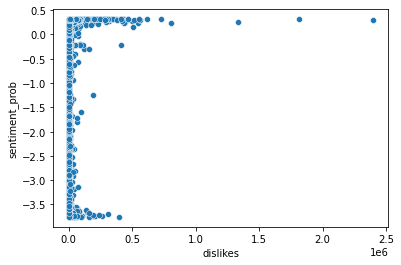

In [39]:
sns.scatterplot(data=scaled_youtube_train, x='dislikes', y='sentiment_prob')

<AxesSubplot:xlabel='dislikes', ylabel='view_count'>

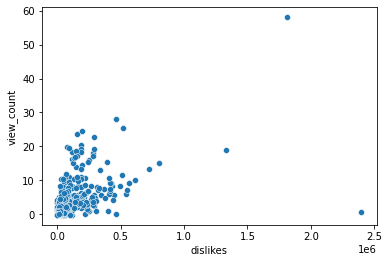

In [40]:
sns.scatterplot(data=scaled_youtube_train, x='dislikes', y='view_count')

<AxesSubplot:xlabel='dislikes', ylabel='likes'>

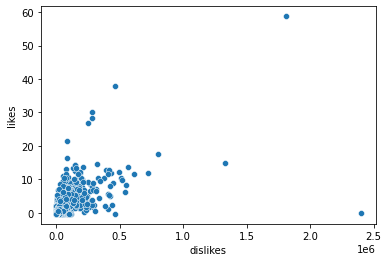

In [41]:
sns.scatterplot(data=scaled_youtube_train, x='dislikes', y='likes')

<AxesSubplot:xlabel='dislikes', ylabel='comment_count'>

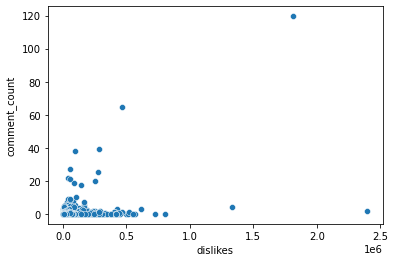

In [42]:
sns.scatterplot(data=scaled_youtube_train, x='dislikes', y='comment_count')

<AxesSubplot:>

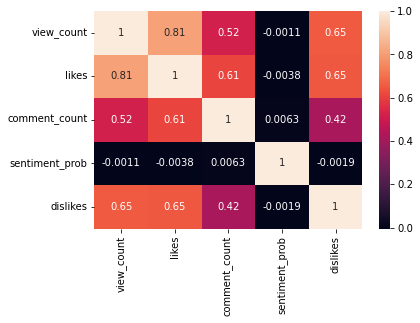

In [43]:
corr = scaled_youtube_train.corr()
sns.heatmap(corr, annot=True)

In [97]:
X = scaled_youtube_train.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
y = scaled_youtube_train['dislikes']

test_X = scaled_youtube_test.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
test_y = scaled_youtube_test['dislikes']

### Linear Regression to get base stats

In [98]:
linearRegressor = LinearRegression().fit(X, y)

In [99]:
predictions = linearRegressor.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

MSE :: 488807276.39937586
MAE :: 3816.942725880868
RMSE :: 22108.98632681688


### Support Vector Regression with kernels

In [100]:
parameters = {'C': np.logspace(-2, 10, 13)}
supportVectorRegressor = SVR()

gridSearcher = GridSearchCV(estimator=supportVectorRegressor, 
                           param_grid=parameters, 
                           cv=5,
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# supportVectorRegressor = SVR(C=1.0, epsilon=0.2).fit(X, y)

C:\Users\swapn\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using RandomForest

In [ ]:
randomForestRegressor = RandomForestRegressor()
parameters = {
    'n_estimators' = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
}

gridSearcher = GridSearchCV(estimator=randomForestRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# randomForestRegressor = RandomForestRegressor(max_depth=2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using XGBoost

In [ ]:
X = train_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
y = train_youtube['dislikes']

test_X = test_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
test_y = test_youtube['dislikes']

xgbooster = xgboost.XGBRegressor()
params = {'reg_alpha': [10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2]}

gridBooster = GridSearchCV(xgbooster, param_grid=params, cv=5,
                      return_train_score=False, refit=True)

gridBooster.fit(X, y)

In [ ]:
predictions = gridBooster.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using FF Network

### Task 02: Using 20 comments as 20 features

In [51]:
def is_ascii(s):
    try:
        s.encode(encoding='utf-8').decode('ascii')
    except UnicodeDecodeError:
        return False
    else:
        return True


### Cleaning individual comments

In [52]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_1']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_1'] = merged_columns

In [53]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_2']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_2'] = merged_columns

In [54]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_2']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_2'] = merged_columns

In [55]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_3']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_3'] = merged_columns

In [56]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_1']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_1'] = merged_columns

In [57]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_4']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_4'] = merged_columns

In [58]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_5']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_5'] = merged_columns

In [59]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_6']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_6'] = merged_columns

In [60]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_7']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_7'] = merged_columns

In [61]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_8']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_8'] = merged_columns

In [62]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_9']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_9'] = merged_columns

In [63]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_10']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_10'] = merged_columns

In [64]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_11']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_11'] = merged_columns

In [65]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_12']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_12'] = merged_columns

In [66]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_13']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_13'] = merged_columns

In [67]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_14']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_14'] = merged_columns

In [68]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_15']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_15'] = merged_columns

In [69]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_16']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_16'] = merged_columns

In [70]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_17']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_17'] = merged_columns

In [71]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_18']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_18'] = merged_columns

In [72]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_19']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_19'] = merged_columns

In [73]:
merged_columns = list()
for index, data in youtube_data.iterrows():
    ascii_comment = str()
    comment = str()
    for c in data['comment_20']:
        if is_ascii(c): ascii_comment += c
    merged_columns.append(ascii_comment)
youtube_data['comment_20'] = merged_columns

In [74]:
cols = list(range(1, 21))

### To lower case

In [75]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}'].str.lower()

### Remove HTML and URLs from comments

In [76]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}']\
        .replace('http\S+', ' ', regex=True)\
        .replace('www\S+', ' ', regex=True)\
        .replace('<\S+>', ' ', regex=True)

### Remove non-alphabetical characters

In [77]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}']\
        .replace('[^\w +]', ' ', regex=True)\
        .replace(r'([\;\:\|•«\n])', ' ', regex=True)

### Remove unnecessary spaces

In [78]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}'].str.strip()
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}']\
        .replace(' +', ' ', regex=True)

### Resolving contractions

In [79]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}']\
        .apply(lambda row: contractions.fix(row))

### Remove digits and words with digits

In [80]:
for i in cols:
    youtube_data[f'comment_{i}'] = youtube_data[f'comment_{i}']\
        .replace('\w*\d\w*', ' ', regex=True)

### Post data cleaning

In [81]:
youtube_data

,video_id,view_count,likes,dislikes,comment_count,comment_1,comment_2,comment_3,comment_4,comment_5,...,comment_12,comment_13,comment_14,comment_15,comment_16,comment_17,comment_18,comment_19,comment_20,merged_comments
0,--0bCF-iK2E,1048888,19515,226,1319,wish him well in manchester united,respect to dortmund fans must be sad losing him,it s so heartbreaking look at sancho playing f...,one of the most talented players bundesliga ha...,a real talent hope he doesn t turn into anothe...,...,he was beast at dortmund hope in united he wil...,this was a nice tribute by the bundesliga to s...,i m dying for him to rediscover this form for ...,here after his first man united goal what a pl...,thank you for your service to dortmund jaden s...,he is forever a joy to watch i wish you all th...,saw him play for england the other day for fir...,his arrival excites me fans of borussia dortmu...,shockingly calm and collective in the box fant...,wish him well in manchester united respect to ...
1,--14w5SOEUs,15352638,359277,7479,18729,rip takeoff the world is going to miss you and...,its been about hrs since takeoffs passing an...,the amount of swag these possess is unmatche...,rip takeoff you will be missed man my deepest ...,i do not think this generation knows how power...,...,words can t describe how tragic his death is o...,i m years old and i ve enjoyed the evolution...,the way migos flow on this track is just incre...,all changed the game of rap there will never...,migos was so fresh so fly undoubtedly one of t...,out of migos entire catalog this is sincerely ...,i have heard several migos songs i listened to...,this is exactly why migos need to be appreciat...,wow this is hip hop i am from the east coast s...,rip takeoff the world is going to miss you and...
2,--40TEbZ9Is,925281,11212,401,831,i get that she isn t a nobody but to see someo...,you can tell juno is not even that upset that ...,there is no rebecca without keeley god my tear...,hannah looking straight into jason s eyes sayi...,that was the shortest episode of ted lasso i h...,...,for years she was theatres best kept secret no...,the chemistry they have on and off screen make...,her blonde hair hair do skin tone toned arms t...,you can tell how grateful she is and how happy...,i feel like she really did not expect this and...,her acceptance speech is what put me over the ...,this is the kind of speech we love genuine fun...,best speech of the night hannah seems like suc...,i nearly cried when i saw jason s face so much...,i get that she isn t a nobody but to see someo...
3,--4tfbSyYDE,2641597,39131,441,3745,jam,,cb jam,ldhk pop,house,...,,,,young,young,,,i never worry about life life,,jam cb jam ldhk pop house ...
4,--DKkzWVh-E,715724,32887,367,1067,keep up with all my projects here get some fre...,your mechanically stabilized earth video inspi...,i recently helped a friend renovate her mother...,i ve worked in construction litigation lawyers...,i built a big deck on my house some years ago ...,...,thanks to videos like these i massively overde...,i only ever did the calculations for one retai...,years ago as a baby apprentice electrician i w...,i was on my hoa board for two terrible years a...,you re single handedly saving my interest in m...,i live right near the nj project it was wild w...,super fascinating grady i m wondering if you h...,as a new geologist at a geotech firm i am lear...,i also learned that in japan retaining walls h...,keep up with all my projects here get some fre...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33113,zzEblS1lEvU,182440,2681,73,217,know your history company that censored their ...,know your history remember that activision rem...,if you actually listen to bezmonov s hour long...,this trailer really hits close to home seeing ...,for those confused about these comments the tr...,...,to all those saying how activision had to bend...,the first stage the second stage the third...,finally yuri bezmeno

## Train - Valid - Test split

In [82]:
train_youtube, test_youtube = train_test_split(youtube_data, train_size=0.80, shuffle=True)

In [83]:
print(train_youtube.shape)
print(test_youtube.shape)

(26494, 26)
(6624, 26)


### Using BERT for getting sentiment probabilities

In [84]:
for i in cols:
    train_comment_sentiment_probs = list()
    for comment in tqdm(train_youtube[f'comment_{i}']):
        [[neg_prob, pos_prob]] = get_prediction_probability(comment)
#         train_comment_sentiment_probs.append(pos_prob if pos_prob >= neg_prob else neg_prob)
        train_comment_sentiment_probs.append(pos_prob)
    train_youtube[f'comment_{i}_probs'] = train_comment_sentiment_probs

  0%|                                                                                        | 0/26494 [00:00<?, ?it/s]C:\Users\swapn\anaconda3\lib\site-packages\transformers\tokenization_utils_base.py:2323: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
100%|████████████████████████████████████████████████████████████████████████████| 26494/26494 [21:13<00:00, 20.80it/s]


In [85]:
for i in cols:
    train_youtube.drop(labels=[f'comment_{i}'], axis=1, inplace=True)
train_youtube

,video_id,view_count,likes,dislikes,comment_count,merged_comments,comment_1_probs,comment_2_probs,comment_3_probs,comment_4_probs,...,comment_11_probs,comment_12_probs,comment_13_probs,comment_14_probs,comment_15_probs,comment_16_probs,comment_17_probs,comment_18_probs,comment_19_probs,comment_20_probs
28173,qIsgdOVGA04,50258169,2575547,31021,115473,we love you all soooo much nothing more beauti...,0.998410,0.981935,0.998637,0.998727,...,0.127022,0.998534,0.998748,0.998585,0.998768,0.998650,0.998687,0.998438,0.998760,0.998685
3493,5aM-vVJF_GU,974880,64506,316,2889,still remember those days when hes a bodyguard...,0.998663,0.995681,0.998769,0.988990,...,0.006094,0.983751,0.972057,0.998616,0.998572,0.989423,0.998758,0.998747,0.998746,0.858588
21966,eOAD3M5lk94,4222294,60062,1971,2615,when a mother especially or family member cont...,0.995038,0.998596,0.009865,0.003818,...,0.001767,0.050020,0.419817,0.986111,0.018725,0.484542,0.967752,0.995763,0.016601,0.993215
28749,rOeWBBksi3U,6118335,542278,5190,33632,first bossfight ...,0.305366,0.996637,0.997544,0.058575,...,0.854749,0.267299,0.113045,0.996613,0.998730,0.996075,0.997845,0.023614,0.987675,0.006185
3966,6VLLK91fAeM,641043,8553,161,857,yet another lesson on how seemingly good debt ...,0.981336,0.002206,0.998658,0.998597,...,0.998675,0.459809,0.935159,0.997367,0.998761,0.998655,0.003569,0.995046,0.505283,0.005158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19376,_JqkOe9uHQc,736377,31157,1124,1880,you will not ever beat the chiefs by kicking f...,0.844678,0.984251,0.998628,0.951543,...,0.998475,0.997703,0.989252,0.998543,0.966905,0.955648,0.998254,0.998629,0.989450,0.998701
10383,IvYCyNG1CfY,3780554,260882,4003,10409,this is a classic case of lifestyle inflation ...,0.923811,0.004866,0.998449,0.002284,...,0.990599,0.002849,0.957763,0.998173,0.954924,0.960930,0.655731,0.947253,0.997270,0.976529
6143,AqqaYs7LjlM,3067498,134285,1554,7774,who is ready for season cleo is such a great...,0.982229,0.998772,0.926954,0.998660,...,0.997868,0.998421,0.996817,0.976891,0.998750,0.982848,0.996218,0.998430,0.998707,0.998708
17910,XT0Mo6Qyb_w,2381574,32655,575,731,kmac pls thanks for having me jared it s an ho...,0.862811,0.998774,0.981417,0.994634,...,0.991439,0.956268,0.998688,0.998769,0.936741,0.838213,0.930786,0.993898,0.986914,0.330773


### Save the dataset

In [91]:
train_youtube.to_csv('train_youtube_cleaned_with_probs_20_comments.csv')

In [86]:
for i in cols:
    test_comment_sentiment_probs = list()
    for comment in tqdm(test_youtube[f'comment_{i}']):
        [[neg_prob, pos_prob]] = get_prediction_probability(comment)
        test_comment_sentiment_probs.append(pos_prob if pos_prob >= neg_prob else neg_prob)
    test_youtube[f'comment_{i}_probs'] = test_comment_sentiment_probs

  0%|                                                                                         | 0/6624 [00:00<?, ?it/s]C:\Users\swapn\anaconda3\lib\site-packages\transformers\tokenization_utils_base.py:2323: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████| 6624/6624 [04:00<00:00, 27.58it/s]


In [87]:
for i in cols:
    test_youtube.drop(labels=[f'comment_{i}'], axis=1, inplace=True)
test_youtube

,video_id,view_count,likes,dislikes,comment_count,merged_comments,comment_1_probs,comment_2_probs,comment_3_probs,comment_4_probs,...,comment_11_probs,comment_12_probs,comment_13_probs,comment_14_probs,comment_15_probs,comment_16_probs,comment_17_probs,comment_18_probs,comment_19_probs,comment_20_probs
19783,aA_6z82JV8Q,5368618,101188,2184,3180,pence have spoken more today than all the othe...,0.998347,0.998444,0.973988,0.965940,...,0.998769,0.976706,0.998661,0.983610,0.991337,0.963838,0.998678,0.974261,0.976228,0.987048
3428,5SD6YGrzf4I,905426,25671,605,1223,i love how in adams imagination everyone calle...,0.998229,0.617478,0.970261,0.998962,...,0.998588,0.955037,0.981915,0.966151,0.832999,0.693772,0.997371,0.997152,0.998618,0.997174
22386,fF5QFZqAb68,561092,14811,119,1016,finally busta rhymes remembers his youtube pas...,0.969641,0.991235,0.998189,0.998772,...,0.987398,0.994484,0.982638,0.998660,0.980418,0.993070,0.998757,0.998611,0.969512,0.871903
22734,ftXbaqtZC0c,239610,10969,157,381,tryna save james from the streets crisps in th...,0.964785,0.875236,0.661518,0.936084,...,0.992025,0.763157,0.996412,0.998699,0.873294,0.743459,0.545814,0.998650,0.871693,0.869986
4678,7rzyGHN5_1s,1891397,50298,670,3669,what magic items are you looking forward to us...,0.935932,0.990804,0.989656,0.998171,...,0.750989,0.802605,0.996312,0.996683,0.995004,0.998408,0.997321,0.975012,0.984750,0.813339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19784,aAgJernobg8,4672819,261363,18252,34407,shitposting on this channel while i work on so...,0.998543,0.910553,0.990799,0.523984,...,0.961245,0.996011,0.998723,0.996628,0.830948,0.862690,0.998750,0.998754,0.998574,0.972622
14206,QF2pM0l8T0s,243130,3169,109,244,notice how pulev wisely used his face to defen...,0.972732,0.985059,0.998762,0.974926,...,0.998710,0.955019,0.926212,0.569721,0.890858,0.998070,0.998451,0.897692,0.809141,0.991208
22232,ew3MDnpEsw0,148812,6668,141,341,i love jennie and jennie s voice she sounds li...,0.998709,0.916157,0.924933,0.944891,...,0.998266,0.998146,0.969854,0.938953,0.998761,0.998766,0.939024,0.991411,0.998730,0.958428
28371,qbR3jtksrfg,1170530,67572,520,4125,let s cry together i really like adele s perso...,0.994674,0.998616,0.987512,0.978024,...,0.998780,0.998711,0.998334,0.996355,0.998784,0.937210,0.998321,0.998721,0.883224,0.998760


In [90]:
train_youtube.drop(labels=['merged_comments'], axis=1, inplace=True)
test_youtube.drop(labels=['merged_comments'], axis=1, inplace=True)

### Save cleaned datasets

In [92]:
test_youtube.to_csv('test_youtube_cleaned_with_probs_20_comments.csv')

### Loading saved datasets

In [ ]:
train_youtube = pd.read_csv('train_youtube_cleaned_with_probs_20_comments.csv')
test_youtube = pd.read_csv('test_youtube_cleaned_with_probs_20_comments.csv')
youtube_data = pd.concat([train_youtube, test_youtube])

train_youtube.drop(labels=['Unnamed: 0', 'video_id'], axis=1, inplace=True)
test_youtube.drop(labels=['Unnamed: 0', 'video_id'], axis=1, inplace=True)
youtube_data.drop(labels=['Unnamed: 0', 'video_id'], axis=1, inplace=True)

youtube_data.reset_index(drop=True, inplace=True)

In [ ]:
youtube_data

### Normalizing and Standardizing

In [93]:
# scaler = StandardScaler()
# scaled_youtube_train = scaler.fit_transform(train_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False))
# scaled_youtube_test = scaler.fit_transform(test_youtube.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False))


In [94]:
# scaled_youtube_train = pd.DataFrame(scaled_youtube_train, columns=['view_count', 'likes', 'comment_count', 'sentiment_prob'])
# scaled_youtube_test = pd.DataFrame(scaled_youtube_test, columns=['view_count', 'likes', 'comment_count', 'sentiment_prob'])

# temp = train_youtube['video_id']
# scaled_youtube_train['video_id'] = temp.reset_index(drop=True)

# temp = train_youtube['dislikes']
# scaled_youtube_train['dislikes'] = temp.reset_index(drop=True) 

# temp = test_youtube['video_id']
# scaled_youtube_test['video_id'] = temp.reset_index(drop=True)

# temp = test_youtube['dislikes']
# scaled_youtube_test['dislikes'] = temp.reset_index(drop=True)

# scaled_youtube_train

### Scatter plots to understand relationship between variables

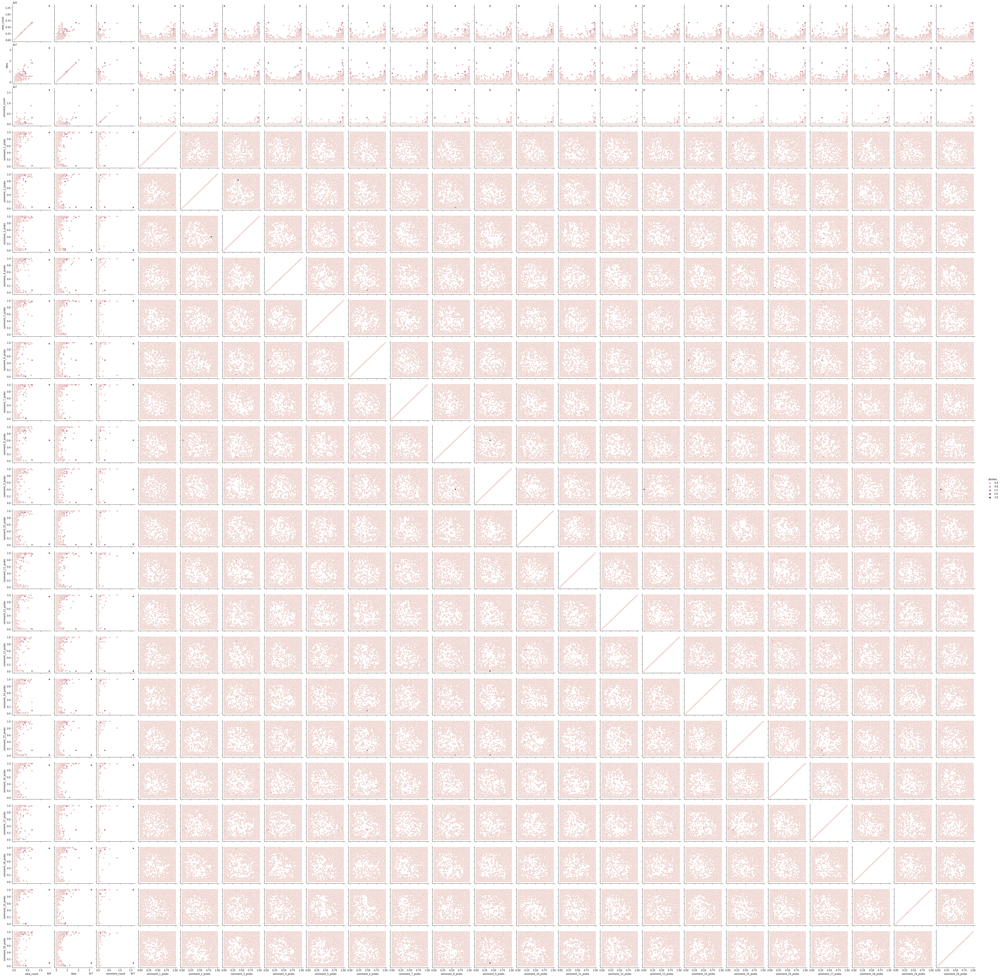

In [4]:
sns.pairplot(data=youtube_data, hue='dislikes', diag_kind=None)

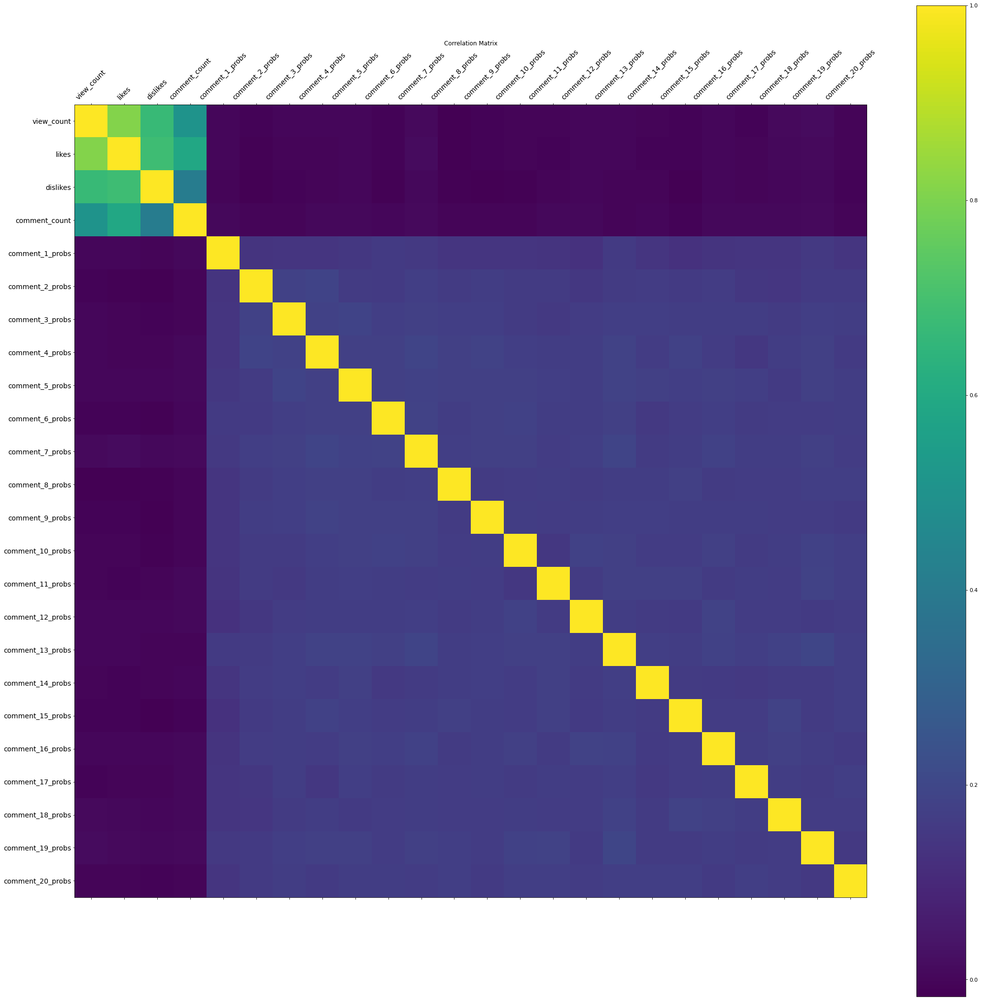

In [71]:
corr = youtube_data.corr()
f = plt.figure(figsize=(36, 36))
plt.matshow(corr, fignum=f.number)
plt.xticks(range(youtube_data.select_dtypes(['number']).shape[1]), youtube_data.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(youtube_data.select_dtypes(['number']).shape[1]), youtube_data.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=11)
plt.title('Correlation Matrix', fontsize=12);

In [ ]:
X = train_youtube.drop(labels=['dislikes'], axis=1, inplace=False)
y = train_youtube['dislikes']

test_X = test_youtube.drop(labels=['dislikes'], axis=1, inplace=False)
test_y = test_youtube['dislikes']

### Linear Regression to get base stats

In [ ]:
linearRegressor = LinearRegression().fit(X, y)

In [ ]:
predictions = linearRegressor.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Support Vector Regression with kernels

In [ ]:
parameters = {'C': np.logspace(-2, 10, 13)}
supportVectorRegressor = SVR()

gridSearcher = GridSearchCV(estimator=supportVectorRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# supportVectorRegressor = SVR(C=1.0, epsilon=0.2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using RandomForest

In [ ]:
randomForestRegressor = RandomForestRegressor()
parameters = {
    'n_estimators' = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
}

gridSearcher = GridSearchCV(estimator=randomForestRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# randomForestRegressor = RandomForestRegressor(max_depth=2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using XGBoost

In [ ]:
xgbooster = xgboost.XGBRegressor()
params = {'reg_alpha': [10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2]}

gridBooster = GridSearchCV(xgbooster, param_grid=params, cv=5,
                      return_train_score=False, refit=True)

gridBooster.fit(X, y)

In [ ]:
predictions = gridBooster.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')


## Balancing the dataset using SMOGN

### Task 01: Using dataset with merged columns

In [60]:
merged_train_youtube_data = pd.read_csv('train_youtube_cleaned_with_probs.csv')
merged_test_youtube_data = pd.read_csv('test_youtube_cleaned_with_probs.csv')

In [61]:
merged_train_youtube_data.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
merged_test_youtube_data.drop(labels=['Unnamed: 0'], axis=1, inplace=True)

merged_train_youtube_data.reset_index(drop=True, inplace=True)
merged_test_youtube_data.reset_index(drop=True, inplace=True)

In [26]:
balanced_train_youtube_data = smogn.smoter(data = merged_train_youtube_data, y = 'dislikes')

C:\Users\swapn\anaconda3\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
r_index: 100%|###################################################################| 2449/2449 [00:02<00:00, 1168.97it/s]


In [30]:
merged_train_youtube_data

,video_id,view_count,likes,dislikes,comment_count,sentiment_prob
0,ZtDMjZsxYC4,929330,23098,184,862,0.998723
1,VIUo6yapDbc,2838352,73551,2170,2854,0.998783
2,6bnaBnd4kyU,4071586,113348,613,3699,0.993899
3,BNeDH6UTmXw,292508,8393,148,935,0.998313
4,HiITxbXAzCg,3264733,203208,910,3445,0.867966
...,...,...,...,...,...,...
26489,OoasY2dlgEE,1081224,15294,898,2228,0.998759
26490,tFGPCtKr0vM,819591,33935,300,406,0.996786
26491,I5HfLtEatHI,5504575,287268,6782,19606,0.998780
26492,97sI2IX4t_s,64321,1085,14,463,0.998475


In [31]:
balanced_train_youtube_data.reset_index(drop=True, inplace=True)
balanced_train_youtube_data

,video_id,view_count,likes,dislikes,comment_count,sentiment_prob
0,V5bHFlTE72I,7164235,254794,2320,8091,0.995051
1,V5bHFlTE72I,3266043,220043,5723,5524,0.986946
2,V5bHFlTE72I,12040564,118152,1420,7092,0.999994
3,V5bHFlTE72I,2708607,207081,2357,9659,0.994677
4,V5bHFlTE72I,2939423,71263,1552,2809,0.974404
...,...,...,...,...,...,...
21090,6XV4h3eZ2dA,812226,16436,308,977,0.998740
21091,OoasY2dlgEE,1081224,15294,898,2228,0.998759
21092,tFGPCtKr0vM,819591,33935,300,406,0.996786
21093,I5HfLtEatHI,5504575,287268,6782,19606,0.998780


In [ ]:
# balanced_train_youtube_data.to_csv('balanced_train_youtube_cleaned_merged_comments.csv')

### Import dataset

In [ ]:
balanced_train_youtube_data = pd.read_csv('balanced_train_youtube_cleaned_merged_comments.csv')
balanced_train_youtube_data.drop(labels=['Unnamed: 0'], axis=1, inplace=True)

In [ ]:
balanced_train_youtube_data

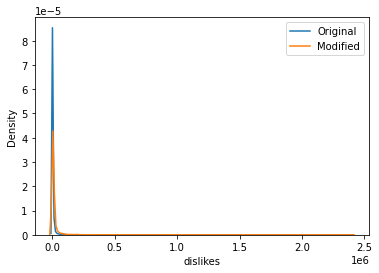

In [64]:
sns.kdeplot(merged_train_youtube_data['dislikes'], label = "Original")
sns.kdeplot(balanced_train_youtube_data['dislikes'], label = "Modified")
plt.legend()

Text(0.5, 1.0, 'Scatter Plots between all features')

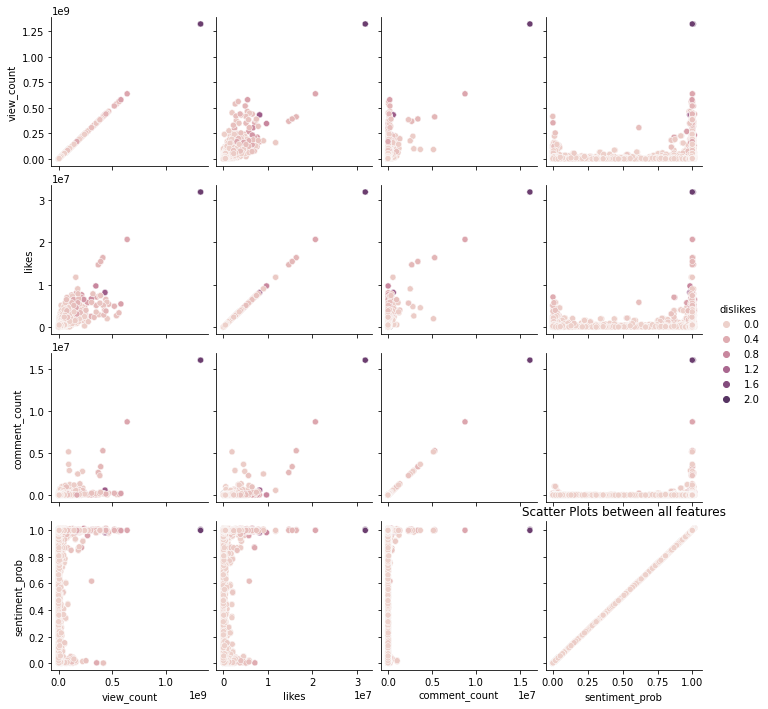

In [96]:
sns.pairplot(data=balanced_train_youtube_data, hue='dislikes', diag_kind=None)
plt.title('Scatter Plots between all features')

<AxesSubplot:>

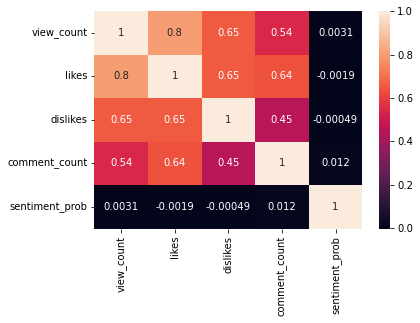

In [35]:
corr = balanced_train_youtube_data.corr()
sns.heatmap(corr, annot=True)

### Re-run all models again to see if there is a change

In [ ]:
X = balanced_train_youtube_data.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
y = balanced_train_youtube_data['dislikes']

test_X = merged_test_youtube_data.drop(labels=['video_id', 'dislikes'], axis=1, inplace=False)
test_y = merged_test_youtube_data['dislikes']

### Linear Regression to get base stats

In [ ]:
linearRegressor = LinearRegression().fit(X, y)

In [ ]:
predictions = linearRegressor.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Support Vector Regression with kernels

In [ ]:
parameters = {'C': np.logspace(-2, 10, 13)}
supportVectorRegressor = SVR()

gridSearcher = GridSearchCV(estimator=supportVectorRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# supportVectorRegressor = SVR(C=1.0, epsilon=0.2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using RandomForest

In [ ]:
randomForestRegressor = RandomForestRegressor()
parameters = {
    'n_estimators' = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
}

gridSearcher = GridSearchCV(estimator=randomForestRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# randomForestRegressor = RandomForestRegressor(max_depth=2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using XGBoost

In [ ]:
xgbooster = xgboost.XGBRegressor()
params = {'reg_alpha': [10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2]}

gridBooster = GridSearchCV(xgbooster, param_grid=params, cv=5,
                      return_train_score=False, refit=True)

gridBooster.fit(X, y)

In [ ]:
predictions = gridBooster.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Task 02: Using dataset with individual columns (SMOGN method as extreme)

In [ ]:
individual_train_youtube_data = pd.read_csv('train_youtube_cleaned_with_probs_20_comments.csv')
individual_test_youtube_data = pd.read_csv('test_youtube_cleaned_with_probs_20_comments.csv')

In [ ]:
individual_train_youtube_data.drop(labels=['video_id', 'Unnamed: 0'], axis=1, inplace=True)
individual_test_youtube_data.drop(labels=['video_id', 'Unnamed: 0'], axis=1, inplace=True)

individual_train_youtube_data.reset_index(drop=True, inplace=True)
individual_test_youtube_data.reset_index(drop=True, inplace=True)

In [75]:
balanced_individual_train_youtube_data = smogn.smoter(data = individual_train_youtube_data, y = 'dislikes', samp_method = 'extreme')

r_index: 100%|####################################################################| 4838/4838 [00:06<00:00, 717.17it/s]


In [76]:
balanced_individual_train_youtube_data.reset_index(drop=True, inplace=True)
balanced_individual_train_youtube_data

,Unnamed: 0,view_count,likes,dislikes,comment_count,comment_1_probs,comment_2_probs,comment_3_probs,comment_4_probs,comment_5_probs,...,comment_11_probs,comment_12_probs,comment_13_probs,comment_14_probs,comment_15_probs,comment_16_probs,comment_17_probs,comment_18_probs,comment_19_probs,comment_20_probs
0,9929,4162856,77479,4429,18003,0.752151,0.970388,0.957317,0.946914,0.875536,...,0.958254,0.944500,0.837975,0.965787,0.919922,0.909506,0.898435,0.916478,0.907146,0.855285
1,5735,4172370,101668,3578,10717,0.956315,0.598069,0.985722,0.983451,0.962608,...,0.991711,0.991973,0.933905,0.988250,0.975242,0.845518,0.969741,0.974634,0.954925,0.984239
2,18717,11425742,393536,5557,7714,0.735232,0.443553,0.993759,0.997497,0.494485,...,0.488742,0.980806,0.997463,0.444251,0.976615,0.989881,0.048972,0.960138,0.941402,0.998748
3,12363,11462697,364640,5533,22025,0.479026,0.901402,0.380496,0.913698,0.913518,...,0.913735,0.903089,0.912733,0.904228,0.665986,0.392744,0.590563,0.895606,0.913731,0.963248
4,16995,2013396,57562,5252,6117,0.847962,0.414218,0.996541,0.382973,0.978082,...,0.612790,0.909202,0.390323,0.949189,0.930707,0.620805,0.989743,0.949279,0.963788,0.998589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35744,5655,180945,7904,308,91,0.967522,0.781747,0.980032,0.005394,0.863272,...,0.998385,0.981443,0.014925,0.196947,0.992525,0.986359,0.997845,0.997151,0.219336,0.958129
35745,19376,736377,31157,1124,1880,0.844678,0.984251,0.998628,0.951543,0.880480,...,0.998475,0.997703,0.989252,0.998543,0.966905,0.955648,0.998254,0.998629,0.989450,0.998701
35746,10383,3780554,260882,4003,10409,0.923811,0.004866,0.998449,0.002284,0.111863,...,0.990599,0.002849,0.957763,0.998173,0.954924,0.960930,0.655731,0.947253,0.997270,0.976529
35747,6143,3067498,134285,1554,7774,0.982229,0.998772,0.926954,0.998660,0.011712,...,0.997868,0.998421,0.996817,0.976891,0.998750,0.982848,0.996218,0.998430,0.998707,0.998708


In [77]:
# balanced_individual_train_youtube_data.to_csv('balanced_train_youtube_cleaned_20_comments.csv')

### Load dataset

In [ ]:
balanced_individual_train_youtube_data = pd.read_csv('balanced_train_youtube_cleaned_20_comments.csv')
balanced_individual_train_youtube_data.drop(labels=['Unnamed: 0.1', 'Unnamed: 0'], axis=1, inplace=True)

In [ ]:
balanced_individual_train_youtube_data

Text(0.5, 1.0, 'Individual Comments after SMOGN')

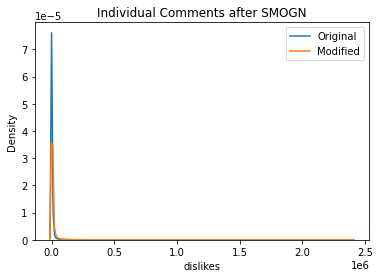

In [95]:
sns.kdeplot(individual_train_youtube_data['dislikes'], label = "Original")
sns.kdeplot(balanced_individual_train_youtube_data['dislikes'], label = "Modified")
plt.legend()
plt.title('Individual Comments after SMOGN')

In [79]:
sns.pairplot(data=balanced_individual_train_youtube_data, hue='dislikes', diag_kind=None)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001D9D9624CA0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
corr = balanced_individual_train_youtube_data.corr()
sns.heatmap(corr, annot=True)

### Re-run all models again to see if there is a change

In [ ]:
X = balanced_individual_train_youtube_data.drop(labels=['dislikes'], axis=1, inplace=False)
y = balanced_individual_train_youtube_data['dislikes']

test_X = individual_test_youtube_data.drop(labels=['dislikes'], axis=1, inplace=False)
test_y = individual_test_youtube_data['dislikes']

### Linear Regression to get base stats

In [ ]:
linearRegressor = LinearRegression().fit(X, y)

In [ ]:
predictions = linearRegressor.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Support Vector Regression with kernels

In [ ]:
parameters = {'C': np.logspace(-2, 10, 13)}
supportVectorRegressor = SVR()

gridSearcher = GridSearchCV(estimator=supportVectorRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# supportVectorRegressor = SVR(C=1.0, epsilon=0.2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using RandomForest

In [ ]:
randomForestRegressor = RandomForestRegressor()
parameters = {
    'n_estimators' = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
}

gridSearcher = GridSearchCV(estimator=randomForestRegressor, 
                           param_grid=parameters, 
                           cv=StratifiedKFold(n_splits=10, shuffle=True),
                           return_train_score=False, refit=True)

gridSearcher.fit(X, y)

# randomForestRegressor = RandomForestRegressor(max_depth=2).fit(X, y)

In [ ]:
predictions = gridSearcher.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')

### Using XGBoost

In [ ]:
xgbooster = xgboost.XGBRegressor()
params = {'reg_alpha': [10**-5, 10**-4, 10**-3, 10**-2, 10**-1, 10**0, 10**1, 10**2]}

gridBooster = GridSearchCV(xgbooster, param_grid=params, cv=5,
                      return_train_score=False, refit=True)

gridBooster.fit(X, y)

In [ ]:
predictions = gridBooster.predict(test_X)
print(f'MSE :: {mean_squared_error(test_y, predictions)}')
print(f'MAE :: {mean_absolute_error(test_y, predictions)}')
print(f'RMSE :: {math.sqrt(mean_squared_error(test_y, predictions))}')